**Some required installation for `PYDICOM` data**. As stated in the [data section](https://www.kaggle.com/competitions/rsna-2022-cervical-spine-fracture-detection/data):

> The **DICOM** image files are ≤ 1 mm slice thickness, axial orientation, and bone kernel. Note that some of the DICOM files are **JPEG compressed**. **You may require additional resources to read the pixel array of these files, such as GDCM and pylibjpeg.**

In [1]:
# Required for some dicom files.
!pip install -q ../input/for-pydicom/pylibjpeg-1.4.0-py3-none-any.whl
!pip install -q ../input/for-pydicom/python_gdcm-3.0.14-cp37-cp37m-manylinux_2_17_x86_64.manylinux2014_x86_64.whl
!pip install -q ../input/for-pydicom/pylibjpeg_libjpeg-1.3.1-cp37-cp37m-manylinux_2_17_x86_64.manylinux2014_x86_64.whl

In [2]:
import os
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import matplotlib.pyplot as plt

import cv2
import pydicom
import nibabel as nib
from glob import glob
from tqdm import tqdm
from pydicom.pixel_data_handlers.util import apply_voi_lut

## Utility

In [3]:
def read_dicom(path, voi_lut = True, fix_monochrome = True):
    '''ref: https://www.kaggle.com/code/raddar/convert-dicom-to-np-array-the-correct-way
    '''
    dicom = pydicom.read_file(path)
    
    # VOI LUT (if available by DICOM device) is used to transform raw DICOM data to "human-friendly" view
    if voi_lut:
        data = apply_voi_lut(dicom.pixel_array, dicom)
    else:
        data = dicom.pixel_array
               
    # depending on this value, X-ray may look inverted - fix that:
    if fix_monochrome and dicom.PhotometricInterpretation == "MONOCHROME1":
        data = np.amax(data) - data
        
    data = data - np.min(data)
    data = data / np.max(data)
    data = (data * 255).astype(np.uint8)
    return data, dicom

def read_nibabel(path):
    return nib.load(path).get_fdata()

In [4]:
def multi_dim_plot(multi_dim_array, num_slices=64):
    fig = plt.figure(figsize=(30, 30))
    plt.title(f'Plotting first {num_slices} slices out of {multi_dim_array.shape}')
    plt.yticks([])
    plt.xticks([])
    
    for i in range(num_slices):
        ax = fig.add_subplot(8, 8, i + 1)
        plt.imshow(multi_dim_array[..., :num_slices][..., i])
        plt.axis("off")
    plt.show()
    
    
def batch_plot(samples, cmap=None):
    plt.figure(figsize=(30, 30))
    
    for i, sample in enumerate(samples):
        ax = plt.subplot(8, 8, i + 1)
        plt.axis('off')
        plt.imshow(sample, cmap=cmap)
    plt.show()

# [Segmentation](https://www.kaggle.com/competitions/rsna-2022-cervical-spine-fracture-detection/data?select=segmentations)

> Please be aware that the **NIFTI** files consist of segmentation in the **sagittal plane**, while the **DICOM** files are in the **axial plane**. Please use the **NIFTI** header information to determine the appropriate orientation such that the **DICOM** images and segmentation match. Otherwise, you run the risk of having the segmentations flipped in the **Z axis** and mirrored in the **X axis**.

Relevant and Important Resources:

- [Determining MR Image Planes](https://www.kaggle.com/code/davidbroberts/determining-mr-image-planes)
- [Connecting voxel spaces](https://www.kaggle.com/code/boojum/connecting-voxel-spaces)
- [Normalized Voxels: Align Planes and Crop](https://www.kaggle.com/code/ren4yu/normalized-voxels-align-planes-and-crop)

In [5]:
segmentation_masks = sorted(
    glob(
        '../input/rsna-2022-cervical-spine-fracture-detection/segmentations/*.nii'
    )
)

# num of segmentation mask
len(segmentation_masks)

87

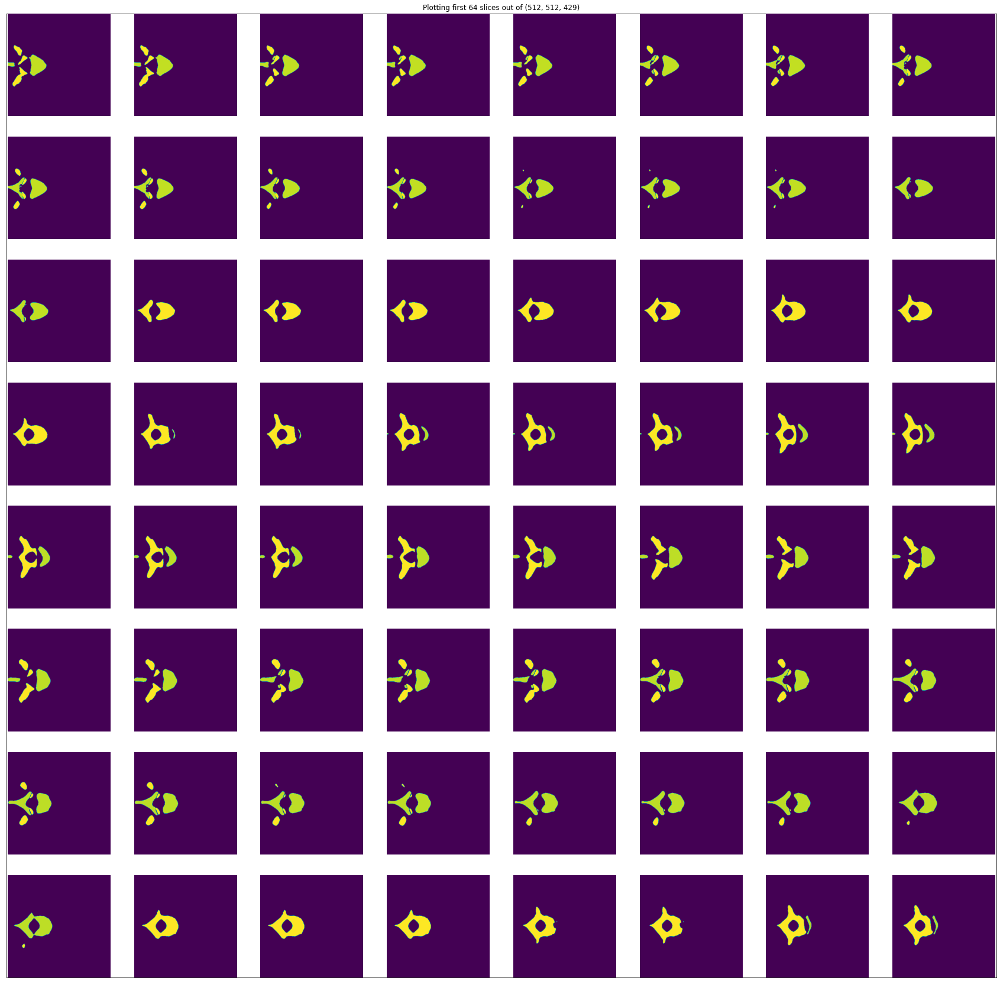

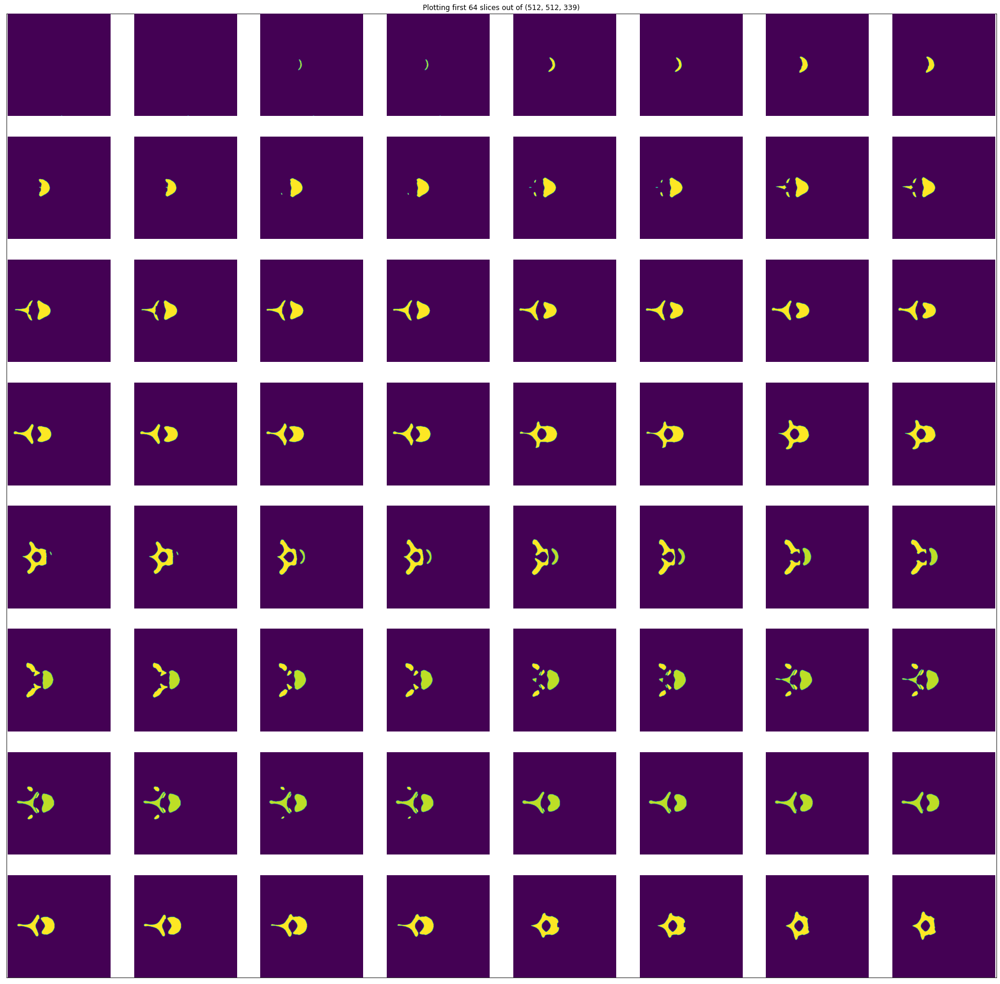

In [6]:
for i, msk in enumerate(segmentation_masks[:2]):
    m = read_nibabel(msk)
    multi_dim_plot(m)

# [Data Frame](https://www.kaggle.com/competitions/rsna-2022-cervical-spine-fracture-detection/data)

In [7]:
train_df = pd.read_csv('../input/rsna-2022-cervical-spine-fracture-detection/train.csv')
train_df.head(15)

,StudyInstanceUID,patient_overall,C1,C2,C3,C4,C5,C6,C7
0,1.2.826.0.1.3680043.6200,1,1,1,0,0,0,0,0
1,1.2.826.0.1.3680043.27262,1,0,1,0,0,0,0,0
2,1.2.826.0.1.3680043.21561,1,0,1,0,0,0,0,0
3,1.2.826.0.1.3680043.12351,0,0,0,0,0,0,0,0
4,1.2.826.0.1.3680043.1363,1,0,0,0,0,1,0,0
5,1.2.826.0.1.3680043.4859,1,0,0,0,0,0,1,0
6,1.2.826.0.1.3680043.18659,1,0,0,0,1,0,0,1
7,1.2.826.0.1.3680043.17364,0,0,0,0,0,0,0,0
8,1.2.826.0.1.3680043.849,0,0,0,0,0,0,0,0
9,1.2.826.0.1.3680043.24045,1,0,0,0,0,0,0,1


In [8]:
train_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2019 entries, 0 to 2018
Data columns (total 9 columns):
 #   Column            Non-Null Count  Dtype 
---  ------            --------------  ----- 
 0   StudyInstanceUID  2019 non-null   object
 1   patient_overall   2019 non-null   int64 
 2   C1                2019 non-null   int64 
 3   C2                2019 non-null   int64 
 4   C3                2019 non-null   int64 
 5   C4                2019 non-null   int64 
 6   C5                2019 non-null   int64 
 7   C6                2019 non-null   int64 
 8   C7                2019 non-null   int64 
dtypes: int64(8), object(1)
memory usage: 142.1+ KB


In [9]:
test_df = pd.read_csv('../input/rsna-2022-cervical-spine-fracture-detection/test.csv')
test_df.head()

,row_id,StudyInstanceUID,prediction_type
0,1.2.826.0.1.3680043.10197_C1,1.2.826.0.1.3680043.10197,C1
1,1.2.826.0.1.3680043.10454_C1,1.2.826.0.1.3680043.10454,C1
2,1.2.826.0.1.3680043.10690_C1,1.2.826.0.1.3680043.10690,C1


# [DICOM](https://www.kaggle.com/competitions/rsna-2022-cervical-spine-fracture-detection/data)

> Please be aware that the **NIFTI** files consist of segmentation in the **sagittal plane**, while the **DICOM** files are in the **axial plane**. Please use the **NIFTI** header information to determine the appropriate orientation such that the **DICOM** images and segmentation match. Otherwise, you run the risk of having the segmentations flipped in the **Z axis** and mirrored in the **X axis**.

Relevant and Important Resources:

- [Determining MR Image Planes](https://www.kaggle.com/code/davidbroberts/determining-mr-image-planes)
- [Connecting voxel spaces](https://www.kaggle.com/code/boojum/connecting-voxel-spaces)
- [Normalized Voxels: Align Planes and Crop](https://www.kaggle.com/code/ren4yu/normalized-voxels-align-planes-and-crop)

In [10]:
dicom_files = glob(
    "../input/rsna-2022-cervical-spine-fracture-detection/train_images/1.2.826.0.1.3680043.10005/*.dcm"
)

len(dicom_files)

259

In [11]:
# read_dicom funciton would retrun 2 things.
# In index 0: dicom.pixel data, index 1: raw read with meta info
sample_dicom = dicom_files[0]
temp_read = read_dicom(sample_dicom)[1]
temp_read

Dataset.file_meta -------------------------------
(0002, 0001) File Meta Information Version       OB: b'\x00\x01'
(0002, 0002) Media Storage SOP Class UID         UI: CT Image Storage
(0002, 0003) Media Storage SOP Instance UID      UI: 1.2.826.0.1.3680043.10005.1.257
(0002, 0010) Transfer Syntax UID                 UI: Explicit VR Little Endian
(0002, 0012) Implementation Class UID            UI: 1.2.40.0.13.1.1.1
(0002, 0013) Implementation Version Name         SH: 'PYDICOM 2.3.0'
-------------------------------------------------
(0008, 0018) SOP Instance UID                    UI: 1.2.826.0.1.3680043.10005.1.257
(0008, 0023) Content Date                        DA: '20220727'
(0008, 0033) Content Time                        TM: '183620.658214'
(0010, 0010) Patient's Name                      PN: '10005'
(0010, 0020) Patient ID                          LO: '10005'
(0018, 0050) Slice Thickness                     DS: '0.625'
(0020, 000d) Study Instance UID                  UI: 1.2.826

In [12]:
# read and plot first 64 dicom files
temp = [read_dicom(i)[0][None, ...] for i in dicom_files[:64]]
temp = np.concatenate(temp, axis=0)
temp.shape

(64, 512, 512)

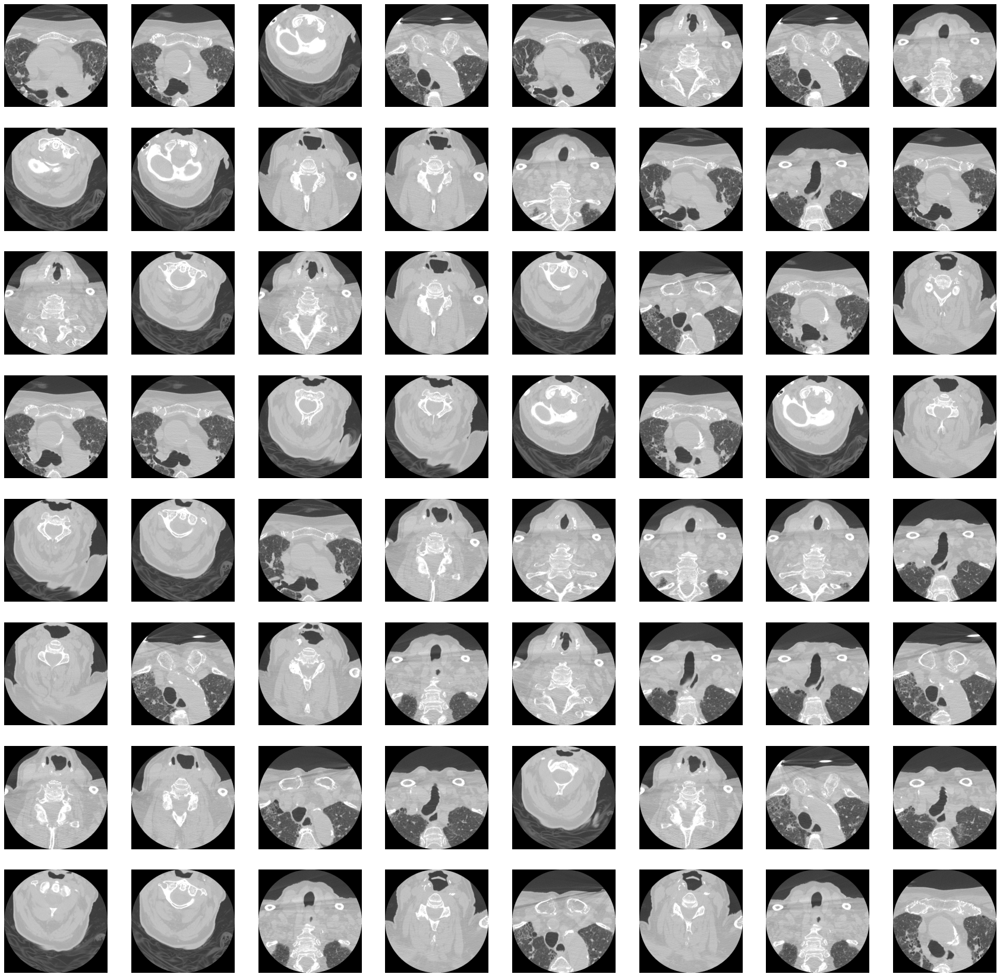

In [13]:
batch_plot(temp, cmap='gray')

# [Bounding Box](https://www.kaggle.com/competitions/rsna-2022-cervical-spine-fracture-detection/data?select=train_bounding_boxes.csv)

In [14]:
df_bbox = pd.read_csv(
    '../input/rsna-2022-cervical-spine-fracture-detection/train_bounding_boxes.csv'
)
# [train/test]_images/[StudyInstanceUID]/[slice_number].dcm
df_bbox.head()

,StudyInstanceUID,x,y,width,height,slice_number
0,1.2.826.0.1.3680043.10051,219.27715,216.71419,17.30440,20.38517,133
1,1.2.826.0.1.3680043.10051,221.56460,216.71419,17.87844,25.24362,134
2,1.2.826.0.1.3680043.10051,216.82151,221.62546,27.00959,26.37454,135
3,1.2.826.0.1.3680043.10051,214.49455,215.48637,27.92726,37.51363,136
4,1.2.826.0.1.3680043.10051,214.00000,215.48637,27.00000,43.51363,137


In [15]:
df_bbox.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7217 entries, 0 to 7216
Data columns (total 6 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   StudyInstanceUID  7217 non-null   object 
 1   x                 7217 non-null   float64
 2   y                 7217 non-null   float64
 3   width             7217 non-null   float64
 4   height            7217 non-null   float64
 5   slice_number      7217 non-null   int64  
dtypes: float64(4), int64(1), object(1)
memory usage: 338.4+ KB


In [16]:
# unique id with bbox labels
len(df_bbox.StudyInstanceUID), df_bbox.StudyInstanceUID.nunique()

(7217, 235)

In [17]:
df_bbox.iloc[0]

StudyInstanceUID    1.2.826.0.1.3680043.10051
x                                   219.27715
y                                   216.71419
width                                 17.3044
height                               20.38517
slice_number                              133
Name: 0, dtype: object

In [18]:
train_images = '../input/rsna-2022-cervical-spine-fracture-detection/train_images/'
len(os.listdir(train_images)) - df_bbox.StudyInstanceUID.nunique()

1784

In [19]:
temp_512 = []
temp_768 = []

#[train/test]_images/[StudyInstanceUID]/[slice_number].dcm
for index, row in tqdm(df_bbox.iterrows(), total=len(df_bbox)):
    with_bbox_dicom_path = os.path.join(
            train_images, str(row['StudyInstanceUID']), str(row['slice_number']) + '.dcm'
        )
    with_bbox_read_dicom, _ = read_dicom(with_bbox_dicom_path)
    
    xmin = int(row['x'])
    ymin = int(row['y'])
    xmax = xmin + int(row['width'])
    ymax = ymin + int(row['height'])
    cv2.rectangle(with_bbox_read_dicom, (xmin, ymin), (xmax, ymax), (0,255,255), 3)
    
    if with_bbox_read_dicom.shape[0] == 512:
        temp_512.append(with_bbox_read_dicom[None, ...])
    else:
        temp_768.append(with_bbox_read_dicom[None, ...])
    
temp_512 = np.concatenate(temp_512, axis=0)
temp_768 = np.concatenate(temp_768, axis=0)
temp_512.shape, temp_768.shape

100%|██████████| 7217/7217 [02:58<00:00, 40.36it/s]


((7203, 512, 512), (14, 768, 768))

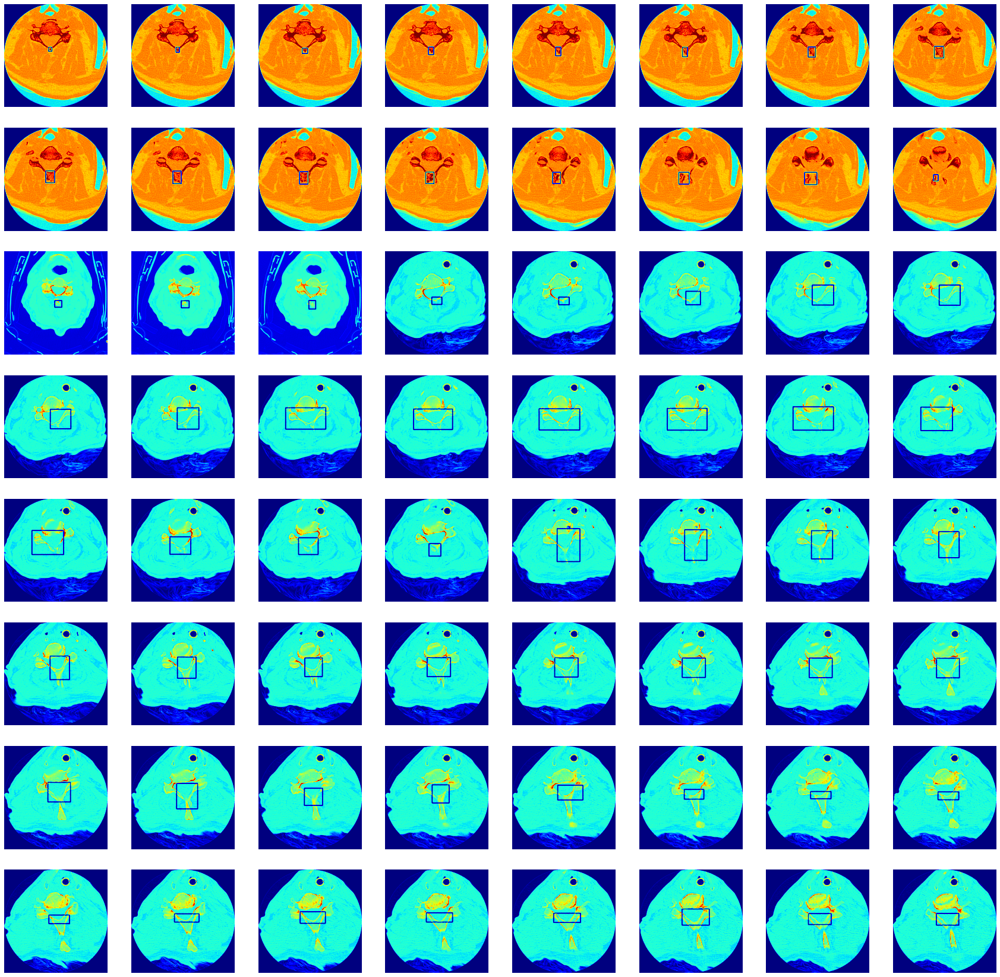

In [20]:
batch_plot(temp_512[:64], cmap='jet')

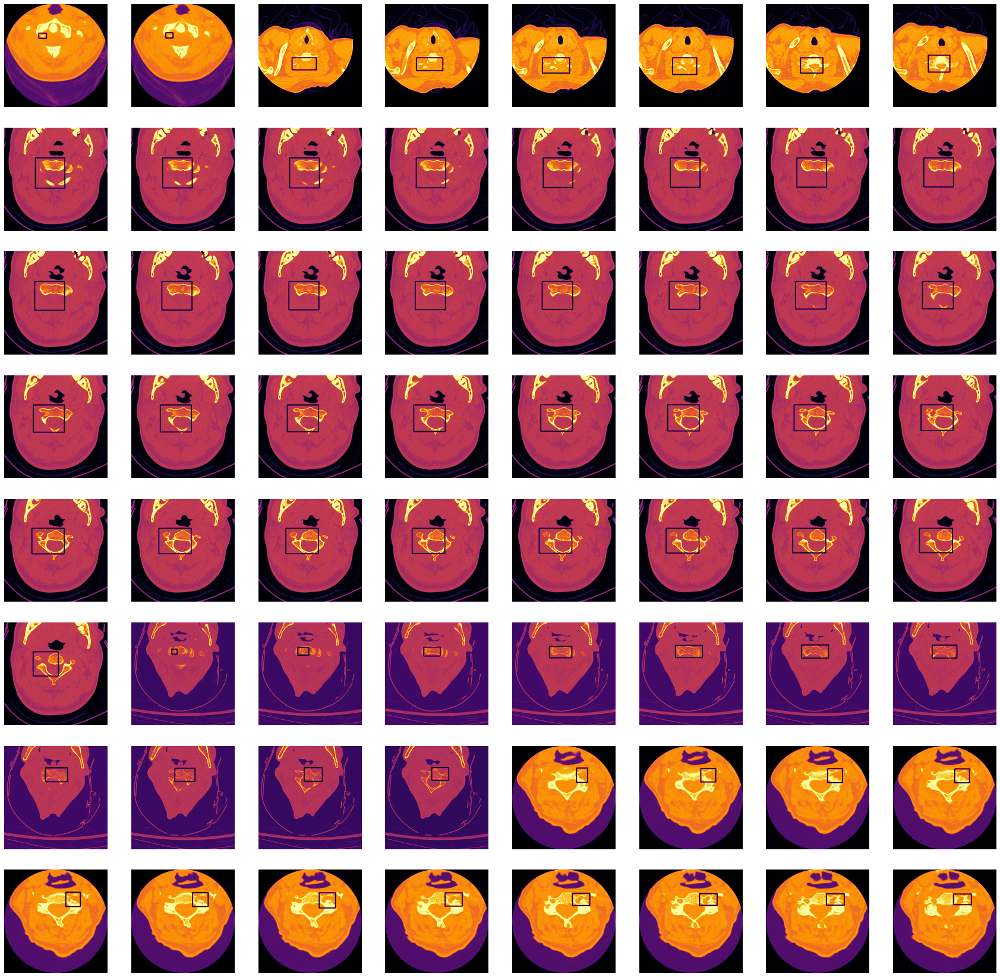

In [21]:
batch_plot(temp_512[-64:], cmap='inferno')

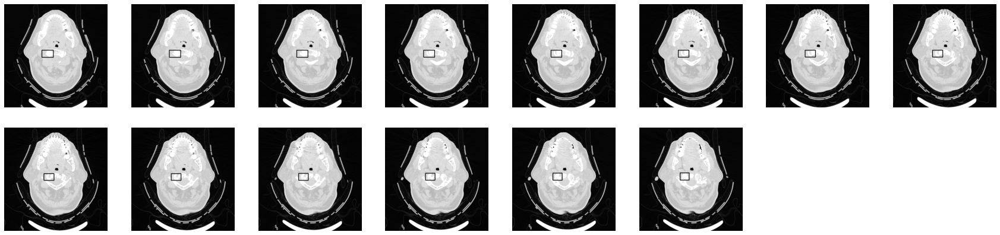

In [22]:
batch_plot(temp_768, cmap='gray')

# [Submission](https://www.kaggle.com/competitions/rsna-2022-cervical-spine-fracture-detection/data?select=sample_submission.csv)

In [23]:
# ref. https://www.kaggle.com/code/paulorzp/rsna2022-cervical-baseline/
means = train_df.mean(numeric_only=True).to_dict()
test_df['fractured'] = test_df['prediction_type'].map(means)
test_df[['row_id','fractured']].to_csv('submission.csv', index=False, float_format='%.1g')
test_df.head()

,row_id,StudyInstanceUID,prediction_type,fractured
0,1.2.826.0.1.3680043.10197_C1,1.2.826.0.1.3680043.10197,C1,0.072313
1,1.2.826.0.1.3680043.10454_C1,1.2.826.0.1.3680043.10454,C1,0.072313
2,1.2.826.0.1.3680043.10690_C1,1.2.826.0.1.3680043.10690,C1,0.072313
